In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dropout, Dense, LeakyReLU, BatchNormalization
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import EarlyStopping

In [2]:
df = pd.read_csv(
    "annotations/list.txt",
    delimiter=" ",
    skiprows=6,
    header=None,
    names=["stem", "class_id", "species", "breed"]
)
df.head()

,stem,class_id,species,breed
0,Abyssinian_100,1,1,1
1,Abyssinian_101,1,1,1
2,Abyssinian_102,1,1,1
3,Abyssinian_103,1,1,1
4,Abyssinian_104,1,1,1


In [3]:
df["class_name"] = df.stem.map(lambda x: x.split("_")[0])
df["image_path"] = df.stem.map(lambda x: f"images/{x}.jpg")
df["annotations"] = df.stem.map(lambda x: f"annotations/trimaps/{x}.png")
df["class_id"] = df["class_id"]-1
df.tail()

,stem,class_id,species,breed,class_name,image_path,annotations
7344,yorkshire_terrier_96,36,2,25,yorkshire,images/yorkshire_terrier_96.jpg,annotations/trimaps/yorkshire_terrier_96.png
7345,yorkshire_terrier_97,36,2,25,yorkshire,images/yorkshire_terrier_97.jpg,annotations/trimaps/yorkshire_terrier_97.png
7346,yorkshire_terrier_98,36,2,25,yorkshire,images/yorkshire_terrier_98.jpg,annotations/trimaps/yorkshire_terrier_98.png
7347,yorkshire_terrier_99,36,2,25,yorkshire,images/yorkshire_terrier_99.jpg,annotations/trimaps/yorkshire_terrier_99.png
7348,yorkshire_terrier_9,36,2,25,yorkshire,images/yorkshire_terrier_9.jpg,annotations/trimaps/yorkshire_terrier_9.png


Text(0.5, 1.0, 'class id')

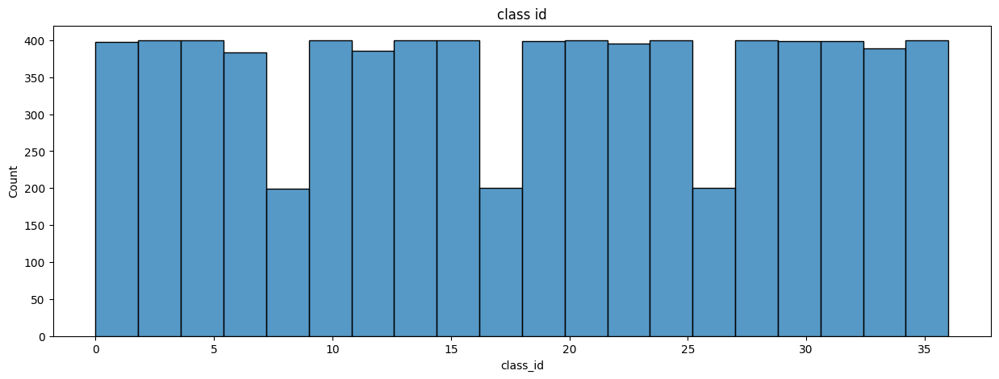

In [4]:
plt.figure(figsize=(15,5))
sns.histplot(df.class_id)
plt.title("class id")

Text(0.5, 1.0, 'Class name')

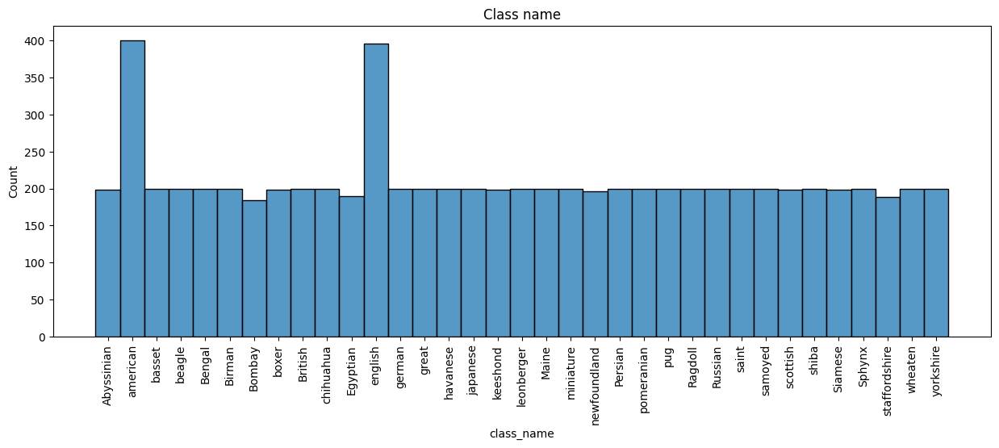

In [5]:
plt.figure(figsize=(15,5))
plot = sns.histplot(df.class_name)
plt.setp(plot.get_xticklabels(), rotation=90)

plt.title("Class name")

Text(0.5, 1.0, 'species')

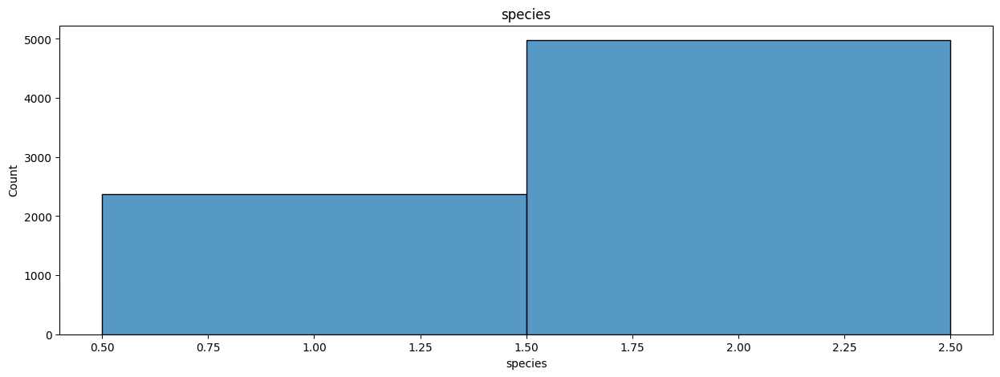

In [6]:
plt.figure(figsize=(15,5))
plot = sns.histplot(df.species, discrete=True)
plt.title("species")

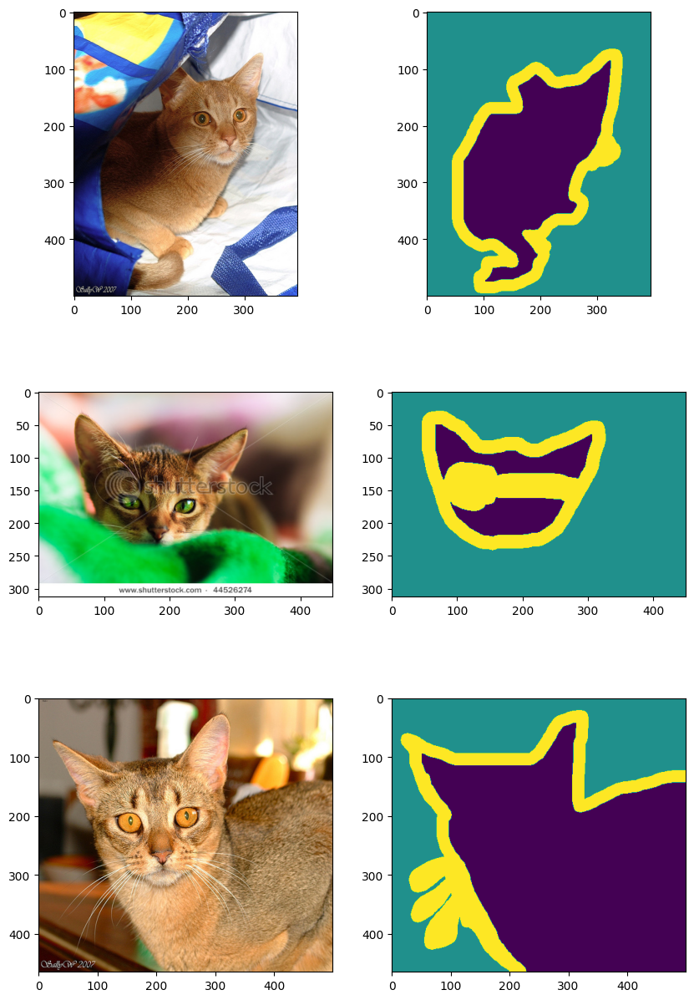

In [7]:
fig, ax = plt.subplots(3,2, figsize=(10,15))

for i in range(3):
    img = Image.open(df.image_path[i])
    annot = Image.open(df.annotations[i])
    ax[i, 0].imshow(img)
    ax[i, 1].imshow(annot)
plt.show()

In [8]:
set(Image.open(df.annotations[i]).getdata())#inside outside border

{1, 2, 3}

In [9]:
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import load_img, img_to_array, array_to_img
import os
import glob
from tqdm import tqdm

In [10]:
BASE_PATH = "images"
IMAGE_SIZE = (256, 256)
RANDOM_STATE = 7
TRAIN_SIZE, VAL_SIZE, TEST_SIZE = 0.8, 0.1, 0.1

In [11]:
BATCH_SIZE = 32
EPOCHS = 200
LEARNING_RATE = 0.0001
PLOTS_DPI = 200

In [12]:
imageNames = [os.path.basename(file) for file in glob.glob(os.path.join(BASE_PATH, '*.jpg'))]

print(f"\nTotal number of image files: {len(imageNames)}")


Total number of image files: 7390


In [13]:
labels = [' '.join(name.split('_')[:-1]) for name in imageNames ]

print(f"\nTotal number of unique labels: {len(np.unique(labels))}")


Total number of unique labels: 37


In [14]:
labelEncDict = {name : ind for ind, name in enumerate(np.unique(labels))}
for k, v in labelEncDict.items():
    print(f"{k:32} : {v}")

Abyssinian                       : 0
Bengal                           : 1
Birman                           : 2
Bombay                           : 3
British Shorthair                : 4
Egyptian Mau                     : 5
Maine Coon                       : 6
Persian                          : 7
Ragdoll                          : 8
Russian Blue                     : 9
Siamese                          : 10
Sphynx                           : 11
american bulldog                 : 12
american pit bull terrier        : 13
basset hound                     : 14
beagle                           : 15
boxer                            : 16
chihuahua                        : 17
english cocker spaniel           : 18
english setter                   : 19
german shorthaired               : 20
great pyrenees                   : 21
havanese                         : 22
japanese chin                    : 23
keeshond                         : 24
leonberger                       : 25
miniature pinscher    

In [15]:
labelDecDict = {ind: name for name, ind in labelEncDict.items()}
for k, v in labelDecDict.items():
    print(f"{k:3} : {v}")

  0 : Abyssinian
  1 : Bengal
  2 : Birman
  3 : Bombay
  4 : British Shorthair
  5 : Egyptian Mau
  6 : Maine Coon
  7 : Persian
  8 : Ragdoll
  9 : Russian Blue
 10 : Siamese
 11 : Sphynx
 12 : american bulldog
 13 : american pit bull terrier
 14 : basset hound
 15 : beagle
 16 : boxer
 17 : chihuahua
 18 : english cocker spaniel
 19 : english setter
 20 : german shorthaired
 21 : great pyrenees
 22 : havanese
 23 : japanese chin
 24 : keeshond
 25 : leonberger
 26 : miniature pinscher
 27 : newfoundland
 28 : pomeranian
 29 : pug
 30 : saint bernard
 31 : samoyed
 32 : scottish terrier
 33 : shiba inu
 34 : staffordshire bull terrier
 35 : wheaten terrier
 36 : yorkshire terrier


In [16]:
for i in labelEncDict.keys():
    print(f"{i:32} : {labels.count(i)}")

Abyssinian                       : 200
Bengal                           : 200
Birman                           : 200
Bombay                           : 200
British Shorthair                : 200
Egyptian Mau                     : 200
Maine Coon                       : 200
Persian                          : 200
Ragdoll                          : 200
Russian Blue                     : 200
Siamese                          : 200
Sphynx                           : 200
american bulldog                 : 200
american pit bull terrier        : 200
basset hound                     : 200
beagle                           : 200
boxer                            : 200
chihuahua                        : 200
english cocker spaniel           : 200
english setter                   : 200
german shorthaired               : 200
great pyrenees                   : 200
havanese                         : 200
japanese chin                    : 200
keeshond                         : 200
leonberger               

In [17]:
imageData = []

for name in tqdm(imageNames, desc = 'Loading image data', unit = ' images'):
    img = load_img(os.path.join(BASE_PATH, name))
    img = tf.image.resize_with_pad(img_to_array(img, dtype = 'uint8'), *IMAGE_SIZE).numpy().astype('uint8')
    imageData.append(img)
    
imageData = np.array(imageData)
imageData.shape

Loading image data: 100%|██████████| 7390/7390 [00:54<00:00, 134.58 images/s]


(7390, 256, 256, 3)

In [18]:
labelsEncoded = list(map(lambda x : labelEncDict.get(x), labels))

for i, l in zip(imageNames[::1000], labelsEncoded[::1000]):
    print(f"{i:32}\t{labelDecDict[l]:32}\t{l}")

Abyssinian_1.jpg                	Abyssinian                      	0
Bengal_1.jpg                    	Bengal                          	1
chihuahua_1.jpg                 	chihuahua                       	17
great_pyrenees_1.jpg            	great pyrenees                  	21
Maine_Coon_1.jpg                	Maine Coon                      	6
pug_1.jpg                       	pug                             	29
scottish_terrier_1.jpg          	scottish terrier                	32
wheaten_terrier_108.jpg         	wheaten terrier                 	35


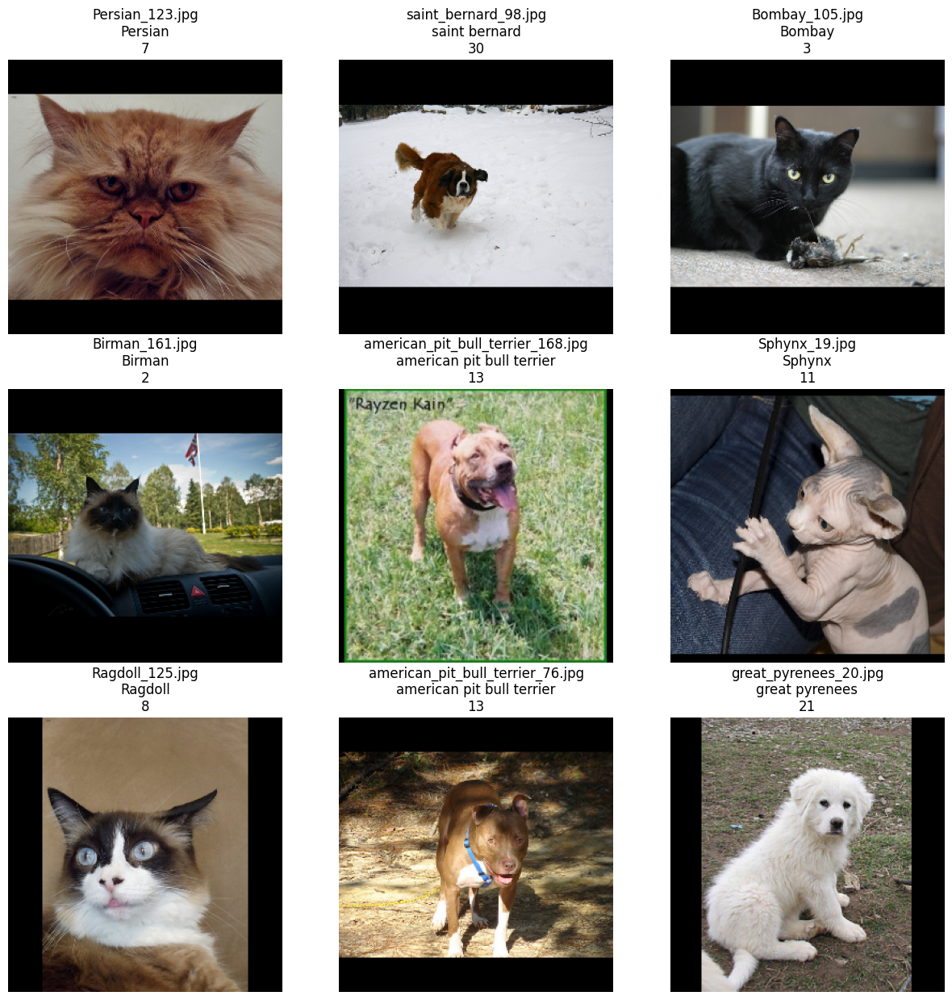

In [19]:
plt.subplots(nrows = 3, ncols = 3, figsize = (15, 15))

for i, imgIndex in enumerate(np.random.randint(0, len(imageNames), size = 9)):
  plt.subplot(3, 3, i + 1)
  plt.axis(False)
  plt.grid(False)
  plt.title(f'{imageNames[imgIndex]}\n{labels[imgIndex]}\n{labelsEncoded[imgIndex]}')
  plt.imshow(imageData[imgIndex])
plt.show()

In [20]:
imageData.max()

255

In [21]:
X_tv, X_test, y_tv, y_test = train_test_split(
    imageData, 
    labelsEncoded, 
    test_size = TEST_SIZE, 
    random_state = RANDOM_STATE, 
    stratify = labelsEncoded
    )

X_train, X_val, y_train, y_val = train_test_split(
    X_tv, 
    y_tv, 
    test_size = VAL_SIZE, 
    random_state = RANDOM_STATE, 
    stratify = y_tv
    )

print(f'Training Data: {X_train.shape}')
print(f'Training Labels: {len(y_train)}')
print(f'\nValidation Data: {X_val.shape}')
print(f'Validation Labels: {len(y_val)}')
print(f'\nTesting Data: {X_test.shape}')
print(f'Testing Labels: {len(y_test)}')

Training Data: (5985, 256, 256, 3)
Training Labels: 5985

Validation Data: (666, 256, 256, 3)
Validation Labels: 666

Testing Data: (739, 256, 256, 3)
Testing Labels: 739


In [22]:
del imageData
del labelsEncoded
del X_tv
del y_tv

In [23]:
train_gen = ImageDataGenerator(rescale = 1./255,
                               rotation_range = 30,
                               width_shift_range = 0.1,
                               height_shift_range = 0.1,
                               shear_range = 0.1,
                               zoom_range = 0.1,
                               horizontal_flip = True,
                               fill_mode = 'nearest')
train_data = train_gen.flow(x = X_train, y = y_train, batch_size = BATCH_SIZE, shuffle = True)
len(train_data)

188

In [24]:
val_gen = ImageDataGenerator(rescale = 1./255)
val_data = val_gen.flow(x = X_val, y = y_val, batch_size = BATCH_SIZE, shuffle = True)
len(val_data)

21

In [25]:
test_gen = ImageDataGenerator(rescale = 1./255)
test_data = test_gen.flow(x = X_test, y = y_test, batch_size = BATCH_SIZE)
len(test_data)

24

In [26]:
def plot_generator_images(gen, suptitle, labelDecDict, print_pred = False, model = None, nrows = 3, ncols = 3, figsize = (12, 12)):
    gen_data = gen.next()
    
    plt.subplots(nrows = nrows, ncols = ncols, figsize = figsize)
    plt.suptitle(suptitle, fontsize = 20)
    plt.tight_layout(rect = [0, 0, 1, 0.96], h_pad = 2)
    
    if(print_pred and model):
        pred = np.argmax(model.predict(gen_data[0]), axis=1)

    for i in range(nrows * ncols):
        plt.subplot(nrows, ncols, i + 1)
        plt.axis(False)
        plt.grid(False)
        
        if(print_pred and pred.any()):
            plt.title(f"True: {labelDecDict[gen_data[1][i]]}\nPredicted: {labelDecDict[pred[i]]}")
        else:
            plt.title(labelDecDict[gen_data[1][i]])
        plt.imshow(gen_data[0][i])

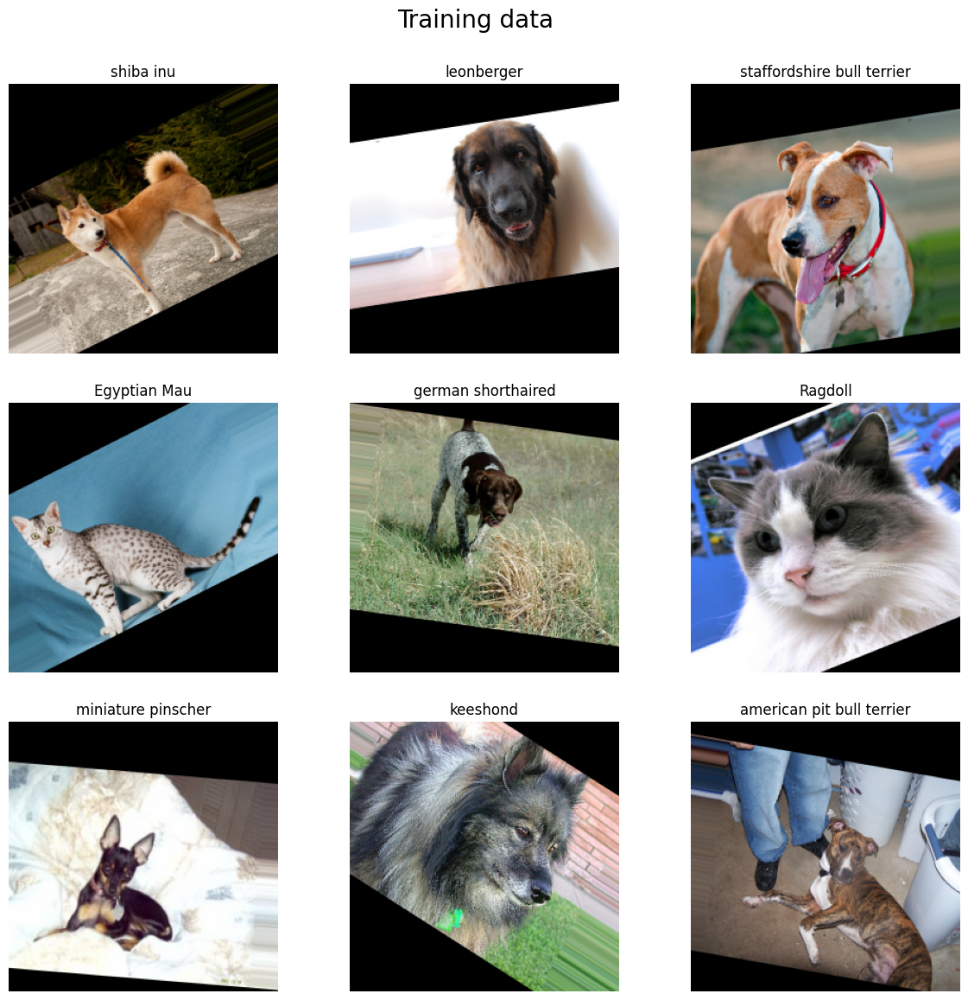

In [27]:
plot_generator_images(train_data, "Training data", labelDecDict)

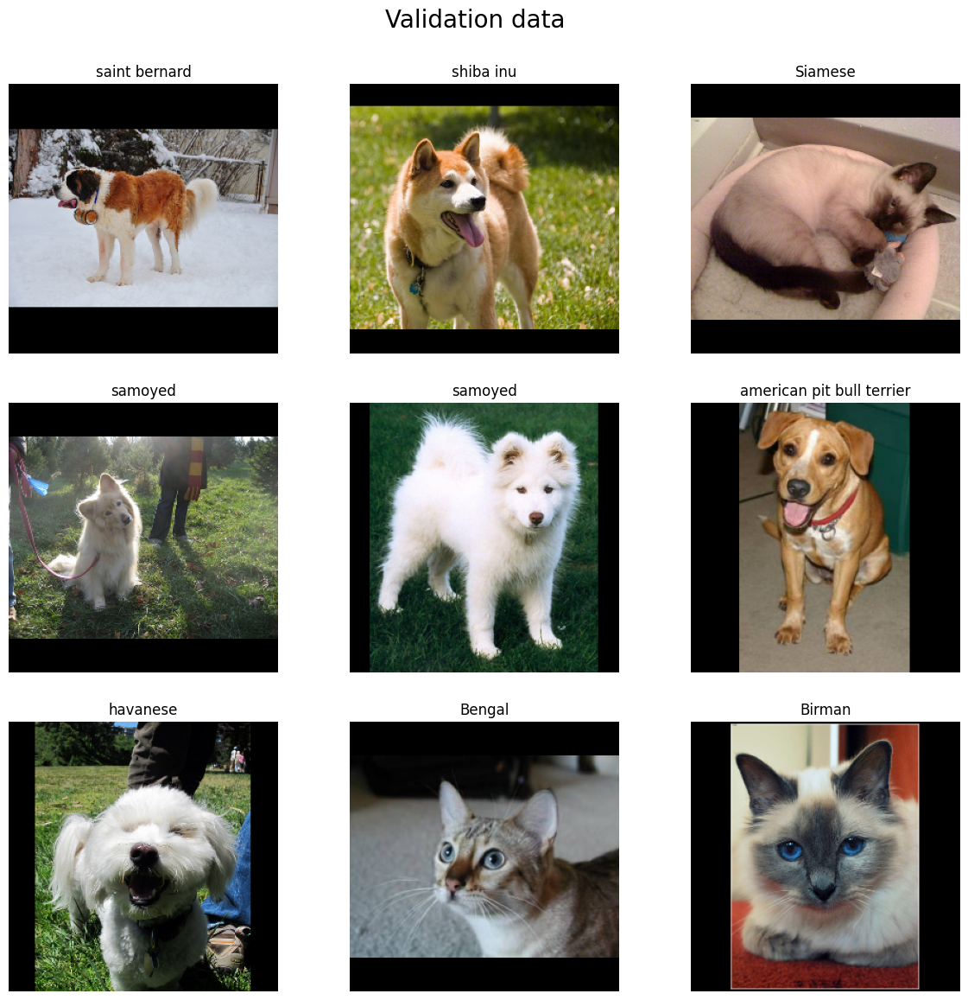

In [28]:
plot_generator_images(val_data, "Validation data", labelDecDict)

In [29]:
model = Sequential([
    Conv2D(32, 5, padding = 'same', input_shape = (*IMAGE_SIZE, 3)),
    Conv2D(32, 5, padding = 'same', activation = LeakyReLU(alpha = 0.5)),
    MaxPooling2D(),
    Conv2D(32, 4, padding = 'same'),
    Conv2D(32, 4, padding = 'same', activation = LeakyReLU(alpha = 0.5)),
    MaxPooling2D(),

    Conv2D(64, 4, padding = 'same'),
    Conv2D(64, 4, padding = 'same', activation = LeakyReLU(alpha = 0.5)),
    MaxPooling2D(),
    BatchNormalization(),
    Conv2D(64, 3, padding = 'same'),
    Conv2D(64, 3, padding = 'same', activation = LeakyReLU(alpha = 0.5)),
    MaxPooling2D(),

    Conv2D(128, 3, padding = 'same'),
    Conv2D(128, 3, padding = 'same', activation = LeakyReLU(alpha = 0.5)),
    MaxPooling2D(),
    Conv2D(128, 2, padding = 'same'),
    Conv2D(128, 2, padding = 'same', activation = LeakyReLU(alpha = 0.5)),
    MaxPooling2D(),

    Conv2D(256, 2, padding = 'same'),
    Conv2D(256, 2, padding = 'same', activation = LeakyReLU(alpha = 0.5)),
    MaxPooling2D(),
    
    Flatten(),
    BatchNormalization(),
    Dropout(0.2),
    Dense(512, activation = 'sigmoid'),
    Dropout(0.2),
    Dense(256, activation = 'sigmoid'),
    Dropout(0.1),
    Dense(len(labelEncDict), activation = 'softmax')
])

model.compile(optimizer = Adam(LEARNING_RATE), 
              loss = 'sparse_categorical_crossentropy', 
              metrics = ['sparse_categorical_accuracy'])
 
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 32)      2432      
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 32)      25632     
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 128, 32)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 128, 128, 32)      16416     
                                                                 
 conv2d_3 (Conv2D)           (None, 128, 128, 32)      16416     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 64, 64, 32)        0         
 g2D)                                                   

In [33]:

earlyStop = EarlyStopping(monitor = 'val_loss', patience = 10, restore_best_weights = True)

history = model.fit(train_data, validation_data = val_data, epochs = EPOCHS, verbose = 1, callbacks = [earlyStop])

Epoch 1/200
188/188 [==============================] - 799s 4s/step - loss: 3.6285 - sparse_categorical_accuracy: 0.0403 - val_loss: 3.6031 - val_sparse_categorical_accuracy: 0.0300
Epoch 2/200
188/188 [==============================] - 783s 4s/step - loss: 3.4761 - sparse_categorical_accuracy: 0.0725 - val_loss: 3.4865 - val_sparse_categorical_accuracy: 0.0601
Epoch 3/200
188/188 [==============================] - 778s 4s/step - loss: 3.3696 - sparse_categorical_accuracy: 0.0942 - val_loss: 3.3025 - val_sparse_categorical_accuracy: 0.1126
Epoch 4/200
188/188 [==============================] - 776s 4s/step - loss: 3.2895 - sparse_categorical_accuracy: 0.1094 - val_loss: 3.1879 - val_sparse_categorical_accuracy: 0.1306
Epoch 5/200
188/188 [==============================] - 776s 4s/step - loss: 3.2018 - sparse_categorical_accuracy: 0.1345 - val_loss: 3.2088 - val_sparse_categorical_accuracy: 0.1291
Epoch 6/200
188/188 [==============================] - 775s 4s/step - loss: 3.1219 - spars

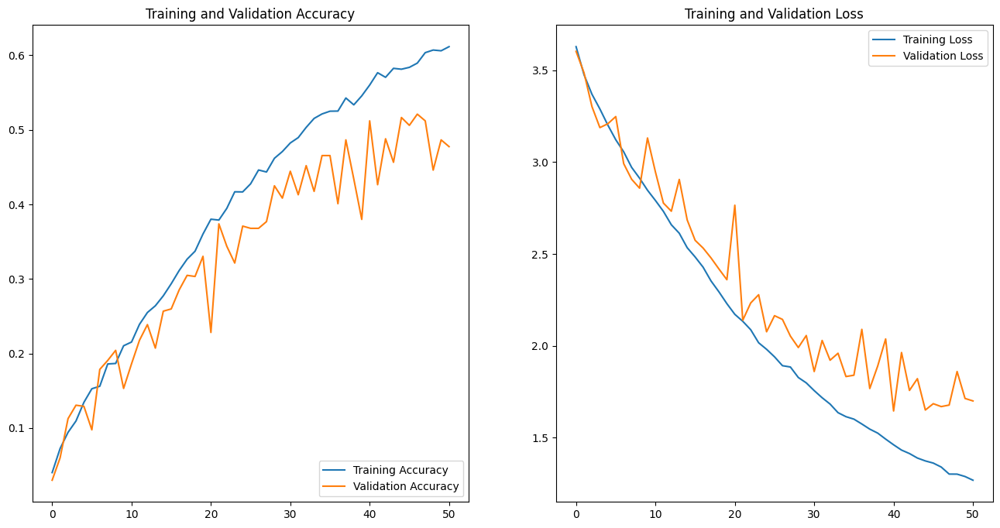

In [38]:
acc = history.history['sparse_categorical_accuracy']
val_acc = history.history['val_sparse_categorical_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = history.epoch

plt.figure(figsize = (16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label = 'Training Accuracy')
plt.plot(epochs_range, val_acc, label = 'Validation Accuracy')
plt.legend(loc = 'lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, val_loss, label = 'Validation Loss')
plt.legend(loc = 'upper right')
plt.title('Training and Validation Loss')
plt.show()

In [36]:
test_loss, test_acc = model.evaluate(test_data, verbose = 0)

print(f"Loss on Testing data: {test_loss}")
print(f"Accuracy on Testing data: {test_acc}")

Loss on Testing data: 1.5876210927963257
Accuracy on Testing data: 0.49932339787483215


1/1 [==============================] - 1s 600ms/step


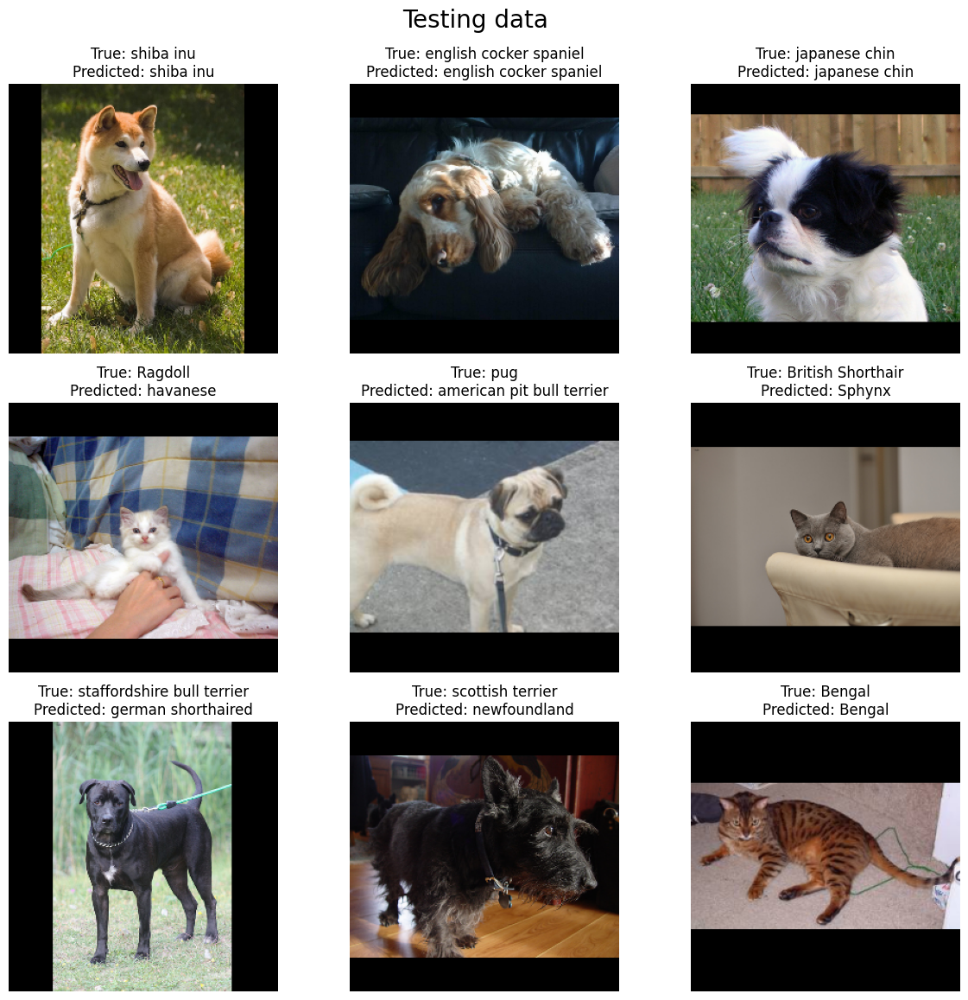

In [39]:
plot_generator_images(test_data, "Testing data", labelDecDict, print_pred = True, model = model)

1/1 [==============================] - 1s 601ms/step


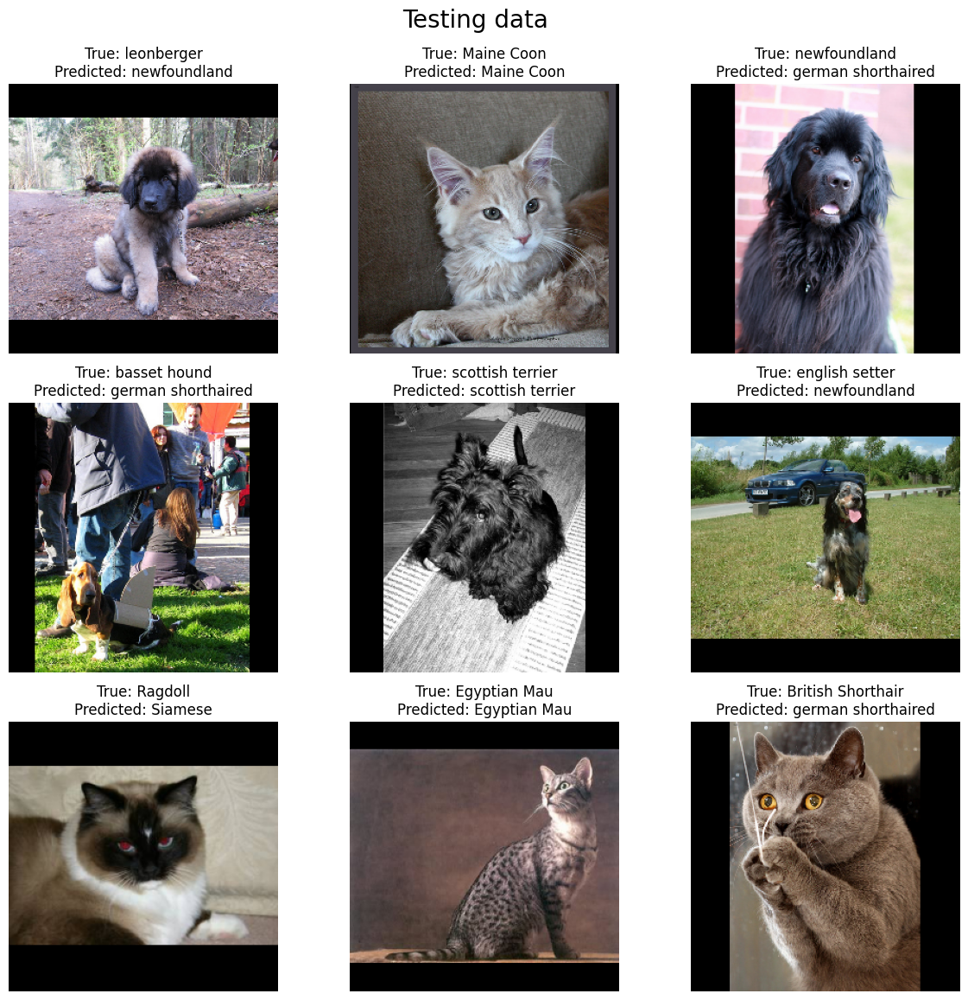

In [40]:
plot_generator_images(test_data, "Testing data", labelDecDict, print_pred = True, model = model)